## Acknowledgments

This Notebook was designed and written by Professor Jon E. Froehlich at the University of Washington along with feedback from students. It is made available freely online as an [open educational resource](https://en.wikipedia.org/wiki/Open_educational_resources) at the teaching website: https://makeabilitylab.github.io/physcomp/. 

The [website](https://github.com/makeabilitylab/physcomp), [Notebook code](https://github.com/makeabilitylab/signals), and [Arduino code](https://github.com/makeabilitylab/arduino) are all open source using the MIT license.

Please file a GitHub Issue or Pull Request for changes/comments.

# Imports

In [1]:
# This cell includes the major classes used in our classification analyses
import matplotlib.pyplot as plt
import numpy as np 
import scipy as sp
from scipy import signal
import random
import os

# We wrote this gesturerec package for the class
# It provides some useful data structures for the accelerometer signal
# and running experiments so you can focus on writing classification code, 
# evaluating your solutions, and iterating 
import gesturerec.utility as grutils
import gesturerec.data as grdata
import gesturerec.gesturestream as grstream
from gesturerec.data import SensorData
from gesturerec.data import GestureSet
from gesturerec.experiments import Experiments
from gesturerec.experiments import ClassificationResults
from gesturerec.experiments import TrialClassificationResult

# Load the data

In [2]:
# Load the data
root_gesture_log_path = './GestureLogs'

print("Found the following gesture log sub-directories")
print(grutils.get_immediate_subdirectories(root_gesture_log_path))

gesture_log_paths = grutils.get_immediate_subdirectories(root_gesture_log_path)
map_gesture_sets = dict()
selected_gesture_set = None

for gesture_log_path in gesture_log_paths:
    path_to_gesture_log = os.path.join(root_gesture_log_path, gesture_log_path)
    # print("Creating a GestureSet object for path '{}'".format(path_to_gesture_log))
    gesture_set = GestureSet(path_to_gesture_log)
    gesture_set.load()
    map_gesture_sets[gesture_set.name] = gesture_set

if selected_gesture_set is None:
    selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "GalenGestures")
    if selected_gesture_set is None:
        # if the selected gesture set is still None
        selected_gesture_set = grdata.get_random_gesture_set(map_gesture_sets);

print("The selected gesture set:", selected_gesture_set)

Found the following gesture log sub-directories
['kyheGestures', 'Matt', 'JonGestures', 'Steph', 'emanuelshalevGestures', 'martypletcher400hzGestures', 'Nathalie', 'AGestures', 'StacyGestures', 'wessonGestures', 'AnjaliGestures', 'ShaunGestures', 'JuliaBGestures', 'SamuelRGestures', 'MikaelGestures', 'Chris', 'Anne', 'ThweidGestures', 'MattCGestures', 'Jose', 'DustinGestures', 'GalenFastGestures', 'AlexisGestures', 'EmmaGestures', 'RahulGestures', 'GalenGestures', 'ClayGestures', 'EvanGearyGestures', 'BryanGestures', 'NanGestures', 'JustinGestures', 'WolfGestures', 'sruthiGestures', 'JonGesturesHarder', 'JaeHGestures', 'NeilGestures', 'AlexandraGestures', 'jlinGestures', 'NickGestures', 'loumagGestures', 'GalenMediumGestures', 'JasonGestures', 'EvanGestures', 'Robin', 'GalenSlowGestures', 'PushkarGestures', 'BrettGestures', 'OjasviGestures', 'RobertsonGestures', 'Jason', 'JonGesturesEasy', 'Kim', 'Amelia', 'martypletcher90hzGestures', 'Paf2Gestures', 'NooseGestures']
The selected gestu

The `map_gesture_sets` is a `dict` object and is our primary data structure: it maps gesture dir names to `GestureSet` objects. There's truly nothing special here. But we realize our data structures do require a learning ramp-up. Let's iterate through the GestureSets.

We have 56 gesture sets:


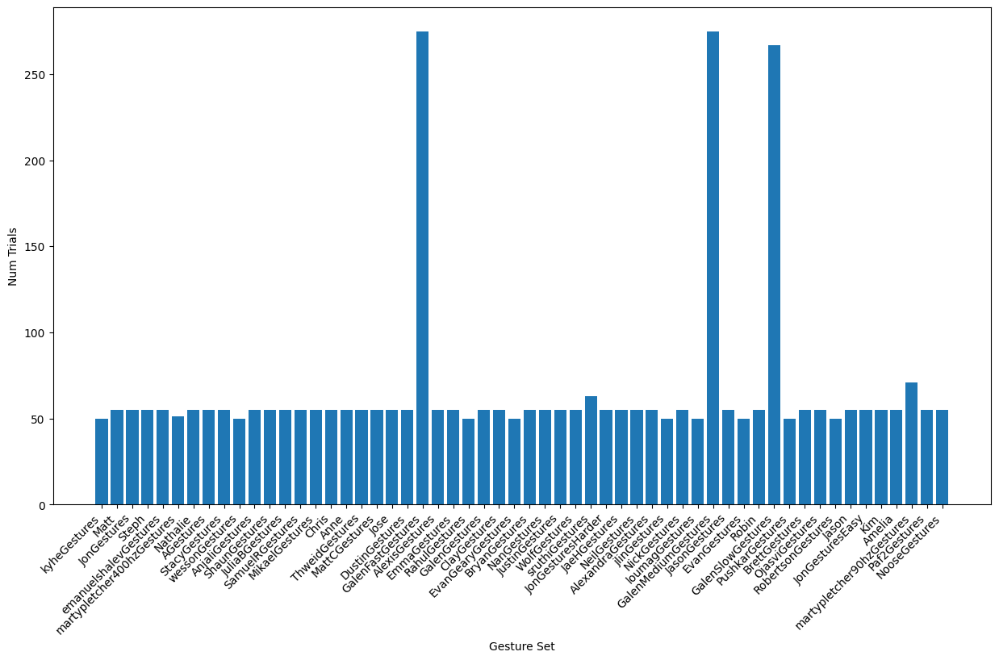

In [3]:
print(f"We have {len(map_gesture_sets)} gesture sets:")

names = []
n_trials = []
for gesture_set_name, gesture_set in map_gesture_sets.items():
    names.append(gesture_set_name)
    n_trials.append(len(gesture_set.get_all_trials()))

plt.figure(figsize=(15, 8))
plt.bar(names, n_trials)
plt.xlabel('Gesture Set')
plt.ylabel('Num Trials')
plt.xticks(rotation=45, ha='right')
plt.show()

# Preprocess the data

You'll want to write your own preprocessing algorithms in `preprocess_signal`. The preprocessed data is stored in SensorData's `x_p`, `y_p`, `z_p`, and `mag_p` while the raw data is `x`, `y`, `z`, and `mag`.

In [4]:
def preprocess_signal(s, templates, tidx):
    '''Preprocesses the signal'''
    def demean(arr):
        mean_value = np.mean(arr)
        return arr - mean_value

    # Smoothing function using scipy's savgol_filter
    # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.savgol_filter.html
    def smooth_array(arr, window_length=10, polyorder=3):
        smoothed_arr = sp.signal.savgol_filter(arr, window_length, polyorder)
        return smoothed_arr

    s = demean(s)
    template = demean(templates[tidx])
    processed_signal = smooth_array(s)
    # Calculate normalized cross-correlation
    processed_signal = np.correlate(processed_signal, template, mode='full') / (np.linalg.norm(processed_signal) * np.linalg.norm(template))
    return processed_signal
    
def create_template(sensor_trials):
    '''Create an average array from mulitple arrays of the same signal'''
    max_length = max(len(arr) for arr in sensor_trials)
    padded_arrays = [np.pad(arr, (0, max_length - len(arr)), mode='constant') for arr in sensor_trials]
    template = np.mean(padded_arrays, axis=0)
    return template

def preprocess_gesture(trials):
    xt = list()
    yt = list()
    zt = list()
    mt = list()
    for trial in trials:
        xt.append(trial.accel.x)
        yt.append(trial.accel.y)
        zt.append(trial.accel.z)
        mt.append(trial.accel.mag)
    xt = create_template(xt)
    yt = create_template(yt)
    zt = create_template(zt)
    mt = create_template(mt)
    templates = (xt, yt, zt, mt) # order matters
    return templates
    

def preprocess_trial(trial, templates):
    '''Processess the given trial'''
    trial.accel.x_p = preprocess_signal(trial.accel.x, templates, 0)
    trial.accel.y_p = preprocess_signal(trial.accel.y, templates, 1)
    trial.accel.z_p = preprocess_signal(trial.accel.z, templates, 2)
    trial.accel.mag_p = preprocess_signal(trial.accel.mag, templates, 3)

for gesture_set in map_gesture_sets.values():
    for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
        templates = preprocess_gesture(trials)
        for trial in trials:
            preprocess_trial(trial, templates)

/tmp/ipykernel_5103/4007274878.py:17: RuntimeWarning: invalid value encountered in divide
  processed_signal = np.correlate(processed_signal, template, mode='full') / (np.linalg.norm(processed_signal) * np.linalg.norm(template))


# Explore the data
We have some example visualizations to help you explore the data (and the result of your preprocessing algorithms) but we expect that you'll want (and need) to write more. Exploring data is fun!

For this, we'll use the `selected_gesture_set` variable, which was set during load. You could change it to something else, however, and rerun these cells. For example:

```
selected_gesture_set = grdata.get_random_gesture_set(map_gesture_sets)
```

or

```
selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Jon")
```

## Plot a random gesture
Let's start by plotting the `x`, `y`, `z` and `mag` for all the trials of a random gesture for the `selected_gesture_set`

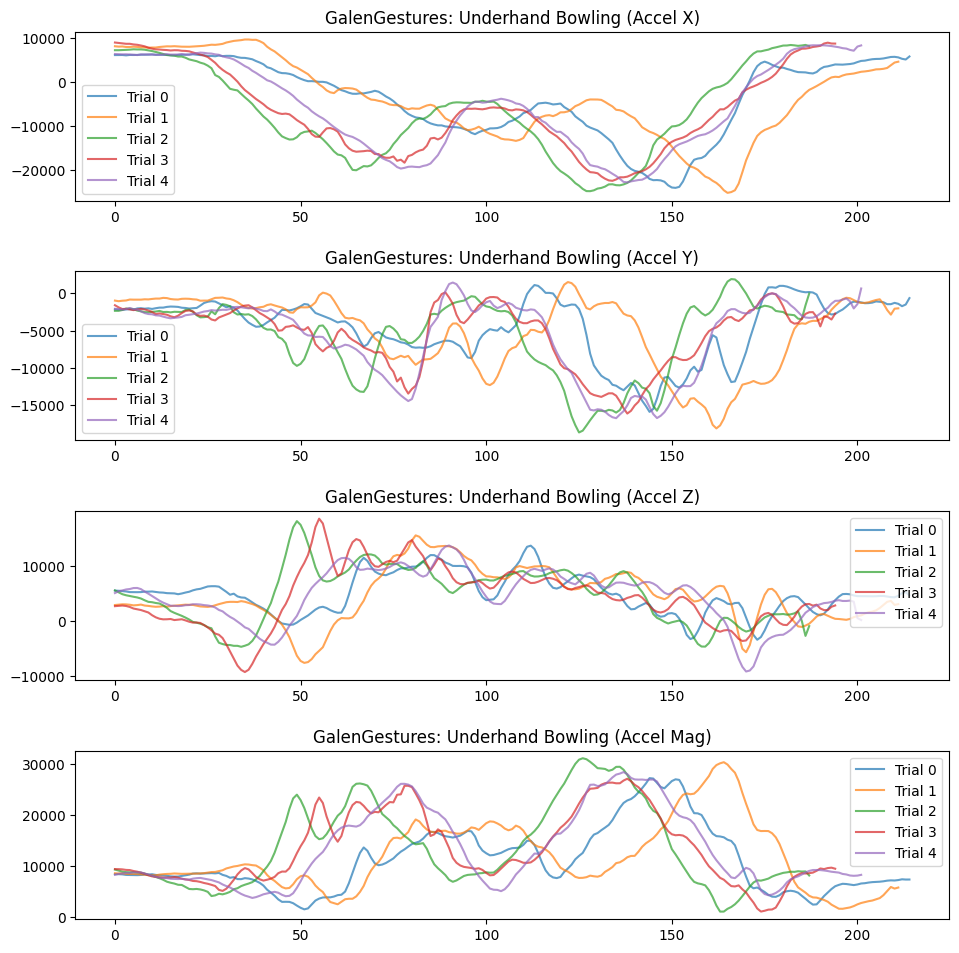

In [5]:
# For example, 
rand_gesture_name = selected_gesture_set.get_random_gesture_name()

# This is where we actually make the plot.
# subplots allows us to make a nice grid of plots. For example, if you want to
# make a 2,2 grid of plots, change the 1 below to 2,2
fig, axes = plt.subplots(4, figsize=(10, 10)) #figsize is width, height
fig.tight_layout(pad=3) # add vertical spacing
gesture_trials = selected_gesture_set.get_trials_for_gesture(rand_gesture_name)
trial_num = 0
for trial in gesture_trials:
    axes[0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
    axes[1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
    axes[2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
    axes[3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
    trial_num = trial_num + 1

# set the title and show the legend
axes[0].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel X)")
axes[0].legend();

axes[1].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Y)")
axes[1].legend();

axes[2].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Z)")
axes[2].legend();

axes[3].set_title(selected_gesture_set.name + ": " + rand_gesture_name + " (Accel Mag)")
axes[3].legend();

## Plot raw and preprocessed signal

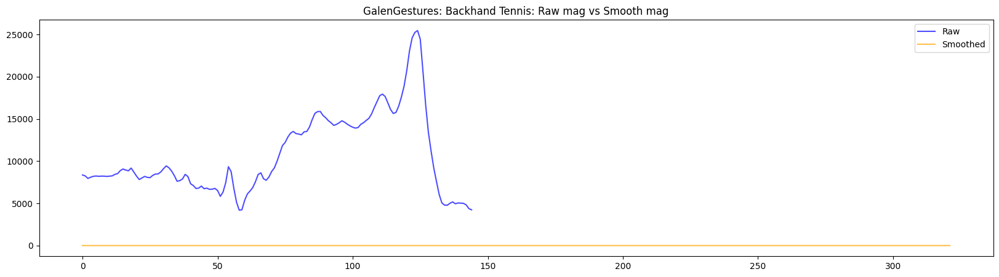

In [6]:
# Now let's plot both the raw and processed signal of a random gesture 
# pulled from a random trial. This helps us explore how our preprocessing
# is working
rand_gesture_name = selected_gesture_set.get_random_gesture_name()

# We'll make a 1x2 grid of plots, so pass 1,2 to subplots
plt.figure(figsize=(20, 5)) #figsize is width, height
rand_trial = selected_gesture_set.get_random_trial_for_gesture(rand_gesture_name)

plt.plot(rand_trial.accel.mag, alpha=0.7, label="Raw".format(rand_trial.trial_num), color="blue")
plt.plot(rand_trial.accel.mag_p, alpha=0.7, label="Smoothed".format(rand_trial.trial_num), color="orange")
plt.title(selected_gesture_set.name + ": " + rand_gesture_name + ": Raw mag vs Smooth mag" )
plt.legend()
plt.show()

## Plot giant grid of signals
Now let's go a bit crazy and plot all of the signals in a giant grid. What patterns do you observe? Do the signals look different? Do you think you could write a classifier to differentiate them?

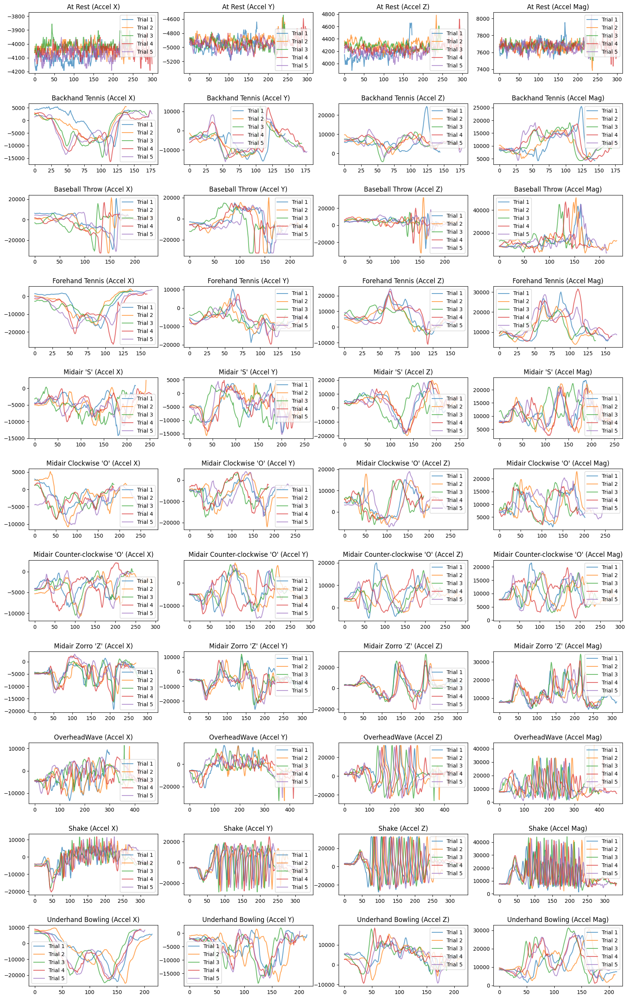

In [7]:
# We are going to make a grid of line graphs with a row for each gesture, so len(mapGestureToTrials) rows
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(selected_gesture_set.map_gestures_to_trials), 4, 
                         figsize=(20, 3 * len(selected_gesture_set.map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = selected_gesture_set.get_trials_for_gesture(gesture_name)
    
    trial_num = 1
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        trial_num = trial_num + 1
        
    axes[index][0].set_title(gesture_name + " (Accel X)")
    axes[index][0].legend()
    
    axes[index][1].set_title(gesture_name + " (Accel Y)")
    axes[index][1].legend()
    
    axes[index][2].set_title(gesture_name + " (Accel Z)")
    axes[index][2].legend()
    
    axes[index][3].set_title(gesture_name + " (Accel Mag)")
    axes[index][3].legend()
    index = index + 1

Now let's plot all of the accel signals, both raw and processed.

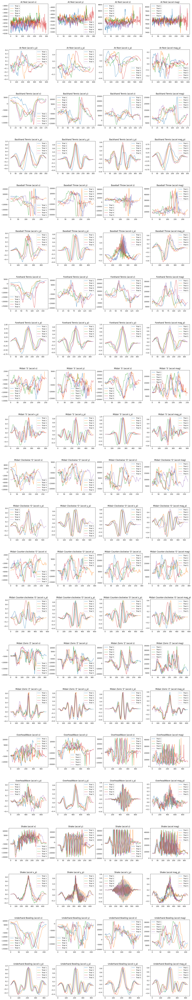

In [8]:
# We are going to make a grid of line graphs with:
# two rows for each gesture (one raw, one processed), so len(mapGestureToTrials) * 2 rows 
# and a column for each signal type, so 4 columns (one for x, y, z, and mag)
fig, axes = plt.subplots(len(selected_gesture_set.map_gestures_to_trials) * 2, 4, 
                         figsize=(20, 5 * 2 * len(selected_gesture_set.map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = selected_gesture_set.get_trials_for_gesture(gesture_name)
    
    trial_num = 1
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.x, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.y, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][2].plot(trial.accel.z, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][3].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        
        axes[index + 1][0].plot(trial.accel.x_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][1].plot(trial.accel.y_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][2].plot(trial.accel.z_p, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index + 1][3].plot(trial.accel.mag_p, alpha=0.7, label="Trial {}".format(trial_num))
        
        trial_num = trial_num + 1
        
    axes[index][0].set_title(gesture_name + " (accel x)")
    axes[index][1].set_title(gesture_name + " (accel y)")
    axes[index][2].set_title(gesture_name + " (accel z)")
    axes[index][3].set_title(gesture_name + " (accel mag)")
    
    axes[index][0].legend()
    axes[index][1].legend()
    axes[index][2].legend()
    axes[index][3].legend()
    
    index = index + 1
    axes[index][0].set_title(gesture_name + " (accel x_p)")
    axes[index][1].set_title(gesture_name + " (accel y_p)")
    axes[index][2].set_title(gesture_name + " (accel z_p)")
    axes[index][3].set_title(gesture_name + " (accel mag_p)")
    
    axes[index][0].legend()
    axes[index][1].legend()
    axes[index][2].legend()
    axes[index][3].legend()
    
    index = index + 1

## Plot raw vs. preprocessed magnitude
Or maybe we just want to focus on the magnitude of the signal. Is there enough visual salience in here that you think this signal alone is discriminable for classifying gestures?

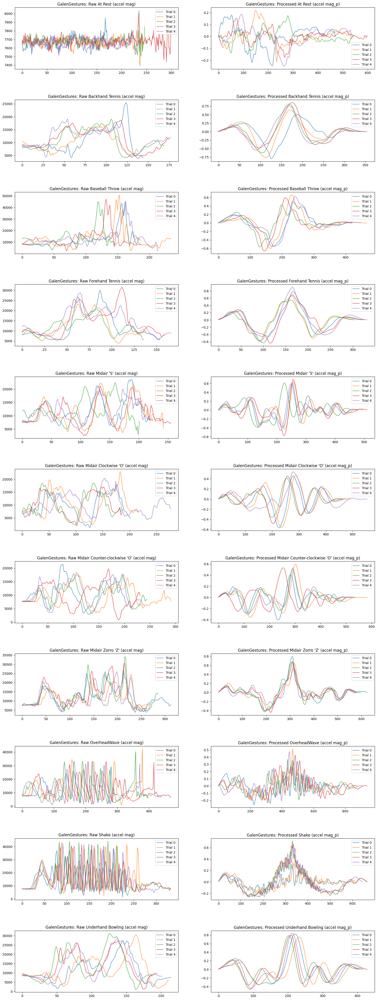

In [9]:
map_gestures_to_trials = selected_gesture_set.map_gestures_to_trials
fig, axes = plt.subplots(len(map_gestures_to_trials), 2, figsize=(20, 5 * len(map_gestures_to_trials)))
fig.subplots_adjust(hspace=0.5)

index = 0
for gesture_name in selected_gesture_set.get_gesture_names_sorted():
    gesture_trials = map_gestures_to_trials[gesture_name]
    trial_num = 0
    for trial in gesture_trials:
        axes[index][0].plot(trial.accel.mag, alpha=0.7, label="Trial {}".format(trial_num))
        axes[index][1].plot(trial.accel.mag_p, alpha=0.7, label="Trial {}".format(trial_num))
        trial_num = trial_num + 1
        
    axes[index][0].set_title(selected_gesture_set.name + ": Raw " + gesture_name + " (accel mag)")
    axes[index][0].legend()
    
    axes[index][1].set_title(selected_gesture_set.name + ": Processed " + gesture_name + " (accel mag_p)")
    axes[index][1].legend()

    index = index + 1


# Classification experiments

Start analyzing and comparing these gesture signals.Think about:
- What patterns do you see in the data?
- What kind of filtering might be useful?
- How can you best align the signals for comparison? (e.g., hint: scroll down to see the Euclidean distance comparisons)
- What kind of signal transforms might be useful? (e.g., ffts, derivative waveforms)
- What is the simplest way we can compare two signals?


## K-Fold Cross Validation Methods

In [10]:
from sklearn.model_selection import StratifiedKFold
def generate_kfolds_scikit(num_folds, gesture_set, seed=None):
    '''
    Here's an example of generating kfolds using scikit but returning our data structure
    
    Parameters:
    num_folds: the number of folds
    gesture_set: the gesture set for splitting into k-folds
    seed: an integer seed value (pass in the same seed value to get the same split across multiple executions)
    
    Returns:
    Returns a list of folds where each list item is a dict() with key=gesture name and value=selected trial 
    for that fold. To generate the same fold structure, pass in the same seed value (this is useful for
    setting up experiments). Note that even with the same seed value, this method and generate_kfolds will
    generate different results.
    '''
    
    trials = []
    trial_nums = []
    gesture_names = []
    for gesture_name, gesture_trials in gesture_set.map_gestures_to_trials.items():
        for trial in gesture_trials:
            trials.append(trial)
            trial_nums.append(trial.trial_num)
            gesture_names.append(gesture_name)
    
    skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=seed)
    
    # Iterate through the splits and setup our data structure
    fold_cnt = 0
    list_folds = list()
    for train_idx, test_idx in skf.split(trials, gesture_names):
        cur_fold_map_gesture_to_trial = dict()
        for i in test_idx:
            cur_fold_map_gesture_to_trial[gesture_names[i]] = trials[i]
        list_folds.append(cur_fold_map_gesture_to_trial)    
        fold_cnt += 1
    return list_folds

def print_folds(list_folds):
    '''
    Prints out the folds (useful for debugging)
    '''
    # print out folds (for debugging)
    fold_index = 0
    if fold_index == 0:
        for fold in list_folds:
            print("Fold: ", fold_index)
            for gesture_name, trial in fold.items():
                print("\t{} Trial: {}".format(gesture_name, trial.trial_num))
            fold_index = fold_index + 1
            
def check_folds(folds):
    '''
    Checks to see that the folds are appropriately setup (useful for debugging)
    Throw an exception if there appears to be a problem
    '''
    for test_fold_idx in range(0, len(folds)):
        # check to make sure test data is not in training data
        for test_gesture, test_trial in folds[test_fold_idx].items():
            # search for this test_gesture and trial_num in all other folds
            # it shouldn't be there!
            for train_fold_idx in range(0, len(folds)):
                if test_fold_idx != train_fold_idx:
                    for train_gesture, train_trial in folds[train_fold_idx].items():
                        if test_gesture == train_gesture and test_trial.trial_num == train_trial.trial_num:
                            raise Exception("Uh oh, gesture '{}' trial '{}' was found in both test fold '{}' and\
                                             training fold '{}.' Training folds should not include test data".format(
                                            test_gesture, test_trial.trial_num, test_fold_idx, train_fold_idx))



## The matching algorithms

We have a top-level function called `run_match_algorithm`, which takes in a list of folds (setup for k-fold cross validation) and a "pointer" to a `find_closest_match_alg` algorithm, which may take one or more arguments (from `**kwargs`)

In [11]:
from scipy.spatial import distance
from fastdtw import fastdtw
import time

def run_matching_algorithm(list_folds, find_closest_match_alg, **kwargs):
    '''
    Our primary matching algorithm function that takes in a fold, a matching algorithm, and optional 
    arguments (**kwargs) for that matching alg. Returns a ClassificationResults object
    
    list_folds : the folds generated by generate_kfolds
    find_closest_match_alg : "pointer" to the closest match function you want to test
    kwargs : optional arguments to pass to find_closest_match_alg
    '''
    
    verbose = False
    if 'verbose' in kwargs:
        verbose = kwargs['verbose']
    
    fold_index = 0
    map_gesture_name_to_list_results = dict()
    for fold in list_folds:
        if verbose:
            print("\n**FOLD: {}**".format(fold_index))
            
        correctness_cnt_for_fold = 0
        elapsed_time_for_fold = 0
        for test_gesture_name, test_trial in fold.items():
            template_folds = list_folds[0:fold_index] + list_folds[fold_index + 1:len(list_folds)]
            template_trials = list()
            for fold in template_folds:
                for template_gesture_name, template_trial in fold.items():
                    template_trials.append(template_trial)
            
            start_time = time.time()
            trial_classification_result = find_closest_match_alg(test_trial, template_trials, **kwargs)
            elapsed_time_in_secs = time.time() - start_time
            trial_classification_result.fold_idx = fold_index
            trial_classification_result.elapsed_time = elapsed_time_in_secs
            elapsed_time_for_fold += elapsed_time_in_secs
            
            if trial_classification_result.is_correct:
                correctness_cnt_for_fold += 1
            
            if verbose:
                print(trial_classification_result)
            
            # track overall results across comparisons
            if test_gesture_name not in map_gesture_name_to_list_results:
                map_gesture_name_to_list_results[test_gesture_name] = list()
            map_gesture_name_to_list_results[test_gesture_name].append(trial_classification_result)
            
        # print out overall fold accuracy
        fold_accuracy = (correctness_cnt_for_fold / len(fold)) * 100;
        if verbose:
            print("COMPLETED FOLD: {} IN {:0.3f} SECS WITH ACCURACY {}/{} ({:0.1f}%)".
                  format(fold_index, elapsed_time_for_fold, correctness_cnt_for_fold, len(fold), fold_accuracy))

        fold_index = fold_index + 1
    
    classification_result = ClassificationResults(find_closest_match_alg.__name__, 
                                                  map_gesture_name_to_list_results, **kwargs)
    return classification_result
            

### Write your matching algorithms here

We've created two simple matching functions to help you understand the format for our experimental testbed.

In [12]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
# from scipy.spatial.distance import (euclidean, braycurtis, canberra, chebyshev, cityblock,
#                                     correlation, cosine, jensenshannon, mahalanobis, minkowski,
#                                     seuclidean, sqeuclidean)

def find_closest_match_euclid_signal(test_trial, template_trials, **kwargs):
    '''
    Example closest match function using euclidean distance and a specified
    signal from SensorData (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p)
    
    This is exactly the same as find_closest_match_euclid_raw_x but more flexible
    in that you can pass a member variable of SensorData in signal_var_name
    
    Example:
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='x')
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='y')
    
    Parameters:
    test_trial: the test trial
    template_trials: the template trials
    kwargs: one required argument for match function
        signal_var_name must be specified and is the member variable of SensorData used for 
        the test (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p )
    
    Returns a TrialClassificationResult
    '''
    
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        
        # Euclidean distance requires that both arrays are the same length, so we must pad the shorter one
        test_trial_signal = getattr(test_trial.accel, signal_var_name)
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        if len(test_trial_signal) > len(template_trial_signal):
            array_length_diff = len(test_trial_signal) - len(template_trial_signal)
            template_trial_signal = np.pad(template_trial_signal, (0, array_length_diff), 'mean')
        elif len(template_trial_signal) > len(test_trial_signal):
            array_length_diff = len(template_trial_signal) - len(test_trial_signal)
            test_trial_signal = np.pad(test_trial_signal, (0, array_length_diff), 'mean')
        
        # Calculate the Euclidean distance between the two signals
        euclid_distance = euclidean(test_trial_signal, template_trial_signal)

        n_best_list_tuple.append((template_trial, euclid_distance))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result


# For example, how about writing a DTW-based algorithm here. 
def find_closest_match_dtw(test_trial, template_trials, **kwargs):
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        
        # Euclidean distance requires that both arrays are the same length, so we must pad the shorter one
        test_trial_signal = getattr(test_trial.accel, signal_var_name)
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        
        # Calculate the DTW distance between the two signals
        # distance, path = fastdtw(test_trial_signal, template_trial_signal, dist=dist)
        if 'dist' not in kwargs:
            distance, path = fastdtw(test_trial_signal, template_trial_signal)
        else:
            distance, path = fastdtw(test_trial_signal.reshape(1, -1), template_trial_signal.reshape(1, -1), dist=kwargs['dist'])
        
        n_best_list_tuple.append((template_trial, distance))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result
    
def find_closest_match_cos(test_trial, template_trials, **kwargs):
    '''
    Example closest match function using euclidean distance and a specified
    signal from SensorData (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p)
    
    This is exactly the same as find_closest_match_euclid_raw_x but more flexible
    in that you can pass a member variable of SensorData in signal_var_name
    
    Example:
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='x')
    run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=True, signal_var_name='y')
    
    Parameters:
    test_trial: the test trial
    template_trials: the template trials
    kwargs: one required argument for match function
        signal_var_name must be specified and is the member variable of SensorData used for 
        the test (e.g., x, y, z, mag, x_p, y_p, z_p, mag_p )
    
    Returns a TrialClassificationResult
    '''
    
    if 'signal_var_name' not in kwargs:
        raise Exception("The 'signal_var_name' kwarg must be specified. For example, \"signal_var_name='x'\"") 
   
    signal_var_name = kwargs['signal_var_name']
    
    # Tuple list of trial to score
    n_best_list_tuple = list()
    for template_trial in template_trials:
        
        # cosine similarity requires that both arrays are the same length, so we must pad the shorter one
        test_trial_signal = getattr(test_trial.accel, signal_var_name)
        template_trial_signal = getattr(template_trial.accel, signal_var_name)
        if len(test_trial_signal) > len(template_trial_signal):
            array_length_diff = len(test_trial_signal) - len(template_trial_signal)
            template_trial_signal = np.pad(template_trial_signal, (0, array_length_diff), 'mean')
        elif len(template_trial_signal) > len(test_trial_signal):
            array_length_diff = len(template_trial_signal) - len(test_trial_signal)
            test_trial_signal = np.pad(test_trial_signal, (0, array_length_diff), 'mean')

        # Reshape the vectors to be 2D arrays
        test_trial_signal = test_trial_signal.reshape(1, -1)
        template_trial_signal = template_trial_signal.reshape(1, -1)
        
        # Calculate the cosine similarity between the two signals
        similarity_arr = cosine_similarity(test_trial_signal, template_trial_signal)
        overall_similarity = np.mean(similarity_arr) * 100

        n_best_list_tuple.append((template_trial, overall_similarity))
    
    trial_classification_result = TrialClassificationResult(test_trial, n_best_list_tuple) 
    
    return trial_classification_result

## Running Experiments

In [13]:
# Run experiments
# Note: remember, we want you to write your own generate_kfolds function
# You can use generate_kfolds_scikit instead if you'd like to test other parts of your code 
# but you must eventually write your own kfold split code for the assignment
gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "GalenGesture")

# TODO: switch this to generate_kfolds once you've written that method.
# For now, you can use our method `generate_kfolds_scikit`
list_folds = generate_kfolds_scikit(5, gesture_set, seed=5) 

# print out folds (for debugging)
# print("DEBUG: PRINTING OUT FOLDS")
# print_folds(list_folds)

# track multiple experiments
experiments = Experiments()

# run initial experiment
results_x = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='x')
results_x.title = "{}: Euclidean distance with x signal".format(gesture_set.name)
experiments.add(results_x)

# run second experiment 
# just giving you a sense of how you can run and track multiple experiments
results_y = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='y')
results_y.title = "{}: Euclidean distance with y signal".format(gesture_set.name)
experiments.add(results_y)

# run third experiment 
results_z = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='z')
results_z.title = "{}: Euclidean distance with z signal".format(gesture_set.name)
experiments.add(results_z)

results_mag = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='mag')
results_mag.title = "{}: Euclidean distance with mag signal".format(gesture_set.name)
experiments.add(results_mag)

In [14]:
# DTW euclidean
results_dtw_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x')
results_dtw_x.title = "{}: DTW distance with x signal".format(gesture_set.name)
experiments.add(results_dtw_x)

results_dtw_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y')
results_dtw_y.title = "{}: DTW distance with y signal".format(gesture_set.name)
experiments.add(results_dtw_y)

results_dtw_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z')
results_dtw_z.title = "{}: DTW distance with z signal".format(gesture_set.name)
experiments.add(results_dtw_z)

results_dtw_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag')
results_dtw_mag.title = "{}: DTW distance with mag signal".format(gesture_set.name)
experiments.add(results_dtw_mag)

In [15]:
# # DTW euclidean
# results_dtw_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x', dist=euclidean)
# results_dtw_x.title = "{}: DTW distance with x signal".format(gesture_set.name)
# experiments.add(results_dtw_x)

# results_dtw_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y', dist=euclidean)
# results_dtw_y.title = "{}: DTW distance with y signal".format(gesture_set.name)
# experiments.add(results_dtw_y)

# results_dtw_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z', dist=euclidean)
# results_dtw_z.title = "{}: DTW distance with z signal".format(gesture_set.name)
# experiments.add(results_dtw_z)

# results_dtw_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag', dist=euclidean)
# results_dtw_mag.title = "{}: DTW distance with mag signal".format(gesture_set.name)
# experiments.add(results_dtw_mag)

In [16]:
# #squared_euclidean
# results_dtw_se_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x',dist=sqeuclidean)
# results_dtw_se_x.title = "{}: DTW squared Euclidean distance with x signal".format(gesture_set.name)
# experiments.add(results_dtw_se_x)

# results_dtw_se_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y',dist=sqeuclidean)
# results_dtw_se_y.title = "{}: DTW squared Euclidean distance with y signal".format(gesture_set.name)
# experiments.add(results_dtw_se_y)

# results_dtw_se_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z',dist=sqeuclidean)
# results_dtw_se_z.title = "{}: DTW squared Euclidean distance with z signal".format(gesture_set.name)
# experiments.add(results_dtw_se_z)

# results_dtw_se_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag',dist=sqeuclidean)
# results_dtw_se_mag.title = "{}: DTW squared Euclidean distance with mag signal".format(gesture_set.name)
# experiments.add(results_dtw_se_mag)

In [17]:
# #manhattan
# results_dtw_mh_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x', dist=cityblock)
# results_dtw_mh_x.title = "{}: DTW manhattan distance with x signal".format(gesture_set.name)
# experiments.add(results_dtw_mh_x)

# results_dtw_mh_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y', dist=cityblock)
# results_dtw_mh_y.title = "{}: DTW manhattan distance with y signal".format(gesture_set.name)
# experiments.add(results_dtw_mh_y)

# results_dtw_mh_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z', dist=cityblock)
# results_dtw_mh_z.title = "{}: DTW manhattan distance with z signal".format(gesture_set.name)
# experiments.add(results_dtw_mh_z)

# results_dtw_mh_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag', dist=cityblock)
# results_dtw_mh_mag.title = "{}: DTW manhattan distance with mag signal".format(gesture_set.name)
# experiments.add(results_dtw_mh_mag)

In [18]:
# #chebyshev
# results_dtw_cb_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x', dist=chebyshev)
# results_dtw_cb_x.title = "{}: DTW chebyshev distance with x signal".format(gesture_set.name)
# experiments.add(results_dtw_cb_x)

# results_dtw_cb_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y', dist=chebyshev)
# results_dtw_cb_y.title = "{}: DTW chebyshev distance with y signal".format(gesture_set.name)
# experiments.add(results_dtw_cb_y)

# results_dtw_cb_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z', dist=chebyshev)
# results_dtw_cb_z.title = "{}: DTW chebyshev distance with z signal".format(gesture_set.name)
# experiments.add(results_dtw_cb_z)

# results_dtw_cb_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag', dist=chebyshev)
# results_dtw_cb_mag.title = "{}: DTW chebyshev distance with mag signal".format(gesture_set.name)
# experiments.add(results_dtw_cb_mag)

In [19]:
# #cosine
# results_dtw_cos_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x', dist=cosine)
# results_dtw_cos_x.title = "{}: DTW Cosine distance with x signal".format(gesture_set.name)
# experiments.add(results_dtw_cos_x)

# results_dtw_cos_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y', dist=cosine)
# results_dtw_cos_y.title = "{}: DTW Cosine distance with y signal".format(gesture_set.name)
# experiments.add(results_dtw_cos_y)

# results_dtw_cos_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z', dist=cosine)
# results_dtw_cos_z.title = "{}: DTW Cosine distance with z signal".format(gesture_set.name)
# experiments.add(results_dtw_cos_z)

# results_dtw_cos_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag', dist=cosine)
# results_dtw_cos_mag.title = "{}: DTW Cosine distance with mag signal".format(gesture_set.name)
# experiments.add(results_dtw_cos_mag)

In [20]:
# Cosine Similarity
results_cos_x = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='x')
results_cos_x.title = "{}: Cosine similarity with x signal".format(gesture_set.name)
experiments.add(results_cos_x)

results_cos_y = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='y')
results_cos_y.title = "{}: Cosine similarity with y signal".format(gesture_set.name)
experiments.add(results_cos_y)

results_cos_z = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='z')
results_cos_z.title = "{}: Cosine similarity with z signal".format(gesture_set.name)
experiments.add(results_cos_z)

results_cos_mag = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='mag')
results_cos_mag.title = "{}: Cosine similarity with mag signal".format(gesture_set.name)
experiments.add(results_cos_mag)

In [21]:
for e in experiments.get_experiments_sorted_by_accuracy():
    e.print_result()
    print()


Title: GalenGestures: Cosine similarity with x signal: 0/55 (0.00%)
Optional arguments: {'verbose': False, 'signal_var_name': 'x'}
Took 0.729s for 55 comparisons (avg=0.013s per match)
- At Rest 0/5 (0.0%)
- Backhand Tennis 0/5 (0.0%)
- Baseball Throw 0/5 (0.0%)
- Forehand Tennis 0/5 (0.0%)
- Midair 'S' 0/5 (0.0%)
- Midair Clockwise 'O' 0/5 (0.0%)
- Midair Counter-clockwise 'O' 0/5 (0.0%)
- Midair Zorro 'Z' 0/5 (0.0%)
- OverheadWave 0/5 (0.0%)
- Shake 0/5 (0.0%)
- Underhand Bowling 0/5 (0.0%)
[[0 0 0 0 0 0 0 0 0 5 0]
 [0 0 4 0 0 0 0 0 1 0 0]
 [0 1 0 0 0 0 0 0 0 4 0]
 [0 0 5 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 5 0]
 [0 1 1 0 0 0 0 0 1 2 0]
 [0 0 1 0 0 0 0 0 0 4 0]
 [0 3 2 0 0 0 0 0 0 0 0]
 [0 3 2 0 0 0 0 0 0 0 0]
 [0 0 4 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 4 1 0]]


Title: GalenGestures: Cosine similarity with y signal: 4/55 (7.27%)
Optional arguments: {'verbose': False, 'signal_var_name': 'y'}
Took 0.716s for 55 comparisons (avg=0.013s per match)
- At Rest 0/5 (0.0%)
- Backhand Tennis

# Visualizing Experiment Results
We've written a number of functions to help visualize experimental results. You'll likely want to add more, for example:
- Visualize incorrect matches. What happened? What could you do to improve your algorithm so these incorrect matches don't occur?

In [22]:
import itertools
from sklearn.metrics import confusion_matrix
from matplotlib.lines import Line2D

def plot_bar_graph_average_scores_by_gesture(classification_results):
    '''
    Plots the average scores for correct and incorrect matches
    A good matching algorithm should have much lower scores for correct
    matches than incorrect matches (if this is not the case, you'll want to work
    on improving your matching algorithm)
    '''
  
    correct_score_means = []
    incorrect_score_means = []
    gesture_names = classification_results.get_gesture_names()
    for gesture_name in gesture_names:
        scores_correct_matches = np.array(classification_results.get_correct_match_scores_for_gesture(gesture_name))
        scores_incorrect_matches = np.array(classification_results.get_incorrect_match_scores_for_gesture(gesture_name))

        if len(scores_correct_matches) > 0:
            correct_score_means.append(np.mean(scores_correct_matches))
        else:
            correct_score_means.append(0)
        
        if len(scores_incorrect_matches) > 0:
            incorrect_score_means.append(np.mean(scores_incorrect_matches))
        else:
            incorrect_score_means.append(0)

    # create plot
    fig, ax = plt.subplots(figsize=(12, 5))
    index = np.arange(len(gesture_names))
    bar_width = 0.35
    opacity = 0.8

    bars_correct = plt.bar(index, correct_score_means, bar_width, alpha=opacity, color='b', label='Correct')
    bars_incorrect = plt.bar(index + bar_width, incorrect_score_means, bar_width, alpha=opacity, color='g', label='Incorrect')

    plt.xlabel('Gesture')
    plt.ylabel('Average Scores')
    plt.title('Average Scores By Gesture and Correctness\n' + classification_results.get_title())
    plt.xticks(index - bar_width, gesture_names, rotation=45)
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_average_nbestlist_location_by_gesture(classification_results):
    '''
    Plots the average n-best list location for each gesture
    '''
    avg_nbestlist_location = []
    gesture_names = classification_results.get_gesture_names()

    for gesture_name in gesture_names:
        correct_match_indices_in_nbestlist = np.array(classification_results.get_correct_match_indices_in_nbestlist_for_gesture(gesture_name))
        avg_nbestlist_location.append(np.mean(correct_match_indices_in_nbestlist))

    # create plot
    fig, ax = plt.subplots(figsize=(12, 5))
    index = np.arange(len(gesture_names))
    # bar_width = 0.35
    opacity = 0.8

    bars_correct = plt.bar(index, avg_nbestlist_location, alpha=opacity, color='b', label='Avg NBest List Location')

    plt.xlabel('Gesture')
    plt.ylabel('Average NBest List Location')
    plt.title('Average NBest List Location By Gesture\n' + classification_results.get_title())
    plt.xticks(index, gesture_names, rotation=45)
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_classification_result_as_confusion_matrix(classification_result, normalize=False, cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    
    Code based on:
      - http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py
    See also
      - https://stackoverflow.com/a/35572520
      - Plotting with matshow: https://matplotlib.org/gallery/images_contours_and_fields/matshow.html#sphx-glr-gallery-images-contours-and-fields-matshow-py
    """
    cm = classification_result.get_confusion_matrix()
    classes = classification_result.get_gesture_names()
    plot_confusion_matrix(cm, classes, classification_result.get_title(), normalize, cmap)
    
def plot_confusion_matrix(cm, classes, title, normalize=False, cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        # print("Normalized confusion matrix")

    # print(cm)
    plt.figure(figsize=(12, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap) #imshow displays data on a 2D raster
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def plot_bar_graph_overall_performance(experiments):
    '''
    Plots a bar graph of overall performance
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_accuracy();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_accuracies = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_accuracies.append(experiment.get_accuracy())

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_accuracies, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_accuracies):
        ax.text(v + 0.01, i, "{:0.2f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Overall Accuracy')
    plt.xlim(0, 1.2)
    plt.title('Overall Accuracy by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_overall_time(experiments):
    '''
    Plots a bar graph of overall computation time per experiment
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_computation_time();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_times = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_times.append(experiment.total_time)

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_times, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_times):
        ax.text(v, i, "{:0.2f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Overall Time (secs)')
    plt.xlim(0, list_experiments[-1].total_time * 1.3)
    plt.title('Overall Time (Secs) by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_bar_graph_avg_time_per_comparison(experiments):
    '''
    Plots a bar graph of average computation time per comparison for each experiment
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_avg_time_per_comparison();
    n_groups = len(list_experiments)

    experiment_names = [] 
    experiment_times = [] 
    for experiment in list_experiments:
        experiment_names.append(experiment.title)
        experiment_times.append(experiment.get_avg_time_per_comparison())

    # create plot
    fig_height = max(n_groups * 0.5, 5)
    fig, ax = plt.subplots(figsize=(12, fig_height))
    index = np.arange(len(experiment_names))
    # bar_width = 0.35
    opacity = 0.8

    plt.grid(zorder=0)
    bars = plt.barh(index, experiment_times, alpha=opacity, color='b', zorder=3)
    
    for i, v in enumerate(experiment_times):
        ax.text(v, i, "{:0.4f}".format(v), color='black', fontweight='bold')
    
    plt.ylabel('Experiment')
    plt.xlabel('Average Time per Comparison (secs)')
    plt.xlim(0, list_experiments[-1].get_avg_time_per_comparison() * 1.2)
    plt.title('Average Time per Comparison (Secs) by Experiment')
    plt.yticks(index, experiment_names)

    plt.tight_layout()
    plt.show()
    
def plot_nbestlist_performance(experiments):
    '''
    Plots a line graph of n-best list performance
    experiments : an Experiments object
    '''
    
    list_experiments = experiments.get_experiments_sorted_by_accuracy();
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    marker = itertools.cycle(('.','o','v','^','<','>','8',
                              's','p','P','*','h','H','+','x','X','D','d','|',
                              '_',0,1,2,3,4,5,6,7,8,9,10,'1','2','3','4',',')) 
    
    for experiment in list_experiments:
        nbest_list_performance = experiment.get_nbestlist_performance()
        axes.plot(nbest_list_performance, marker=next(marker), label=experiment.title)
    
    axes.grid()
    axes.legend()
    axes.set_title("Accuracy as a Function of N-Best List Position")
    axes.set_ylabel("Accuracy (%)")
    axes.set_ylim(0, 1.1)
    axes.set_xlabel("N-Best List Position")

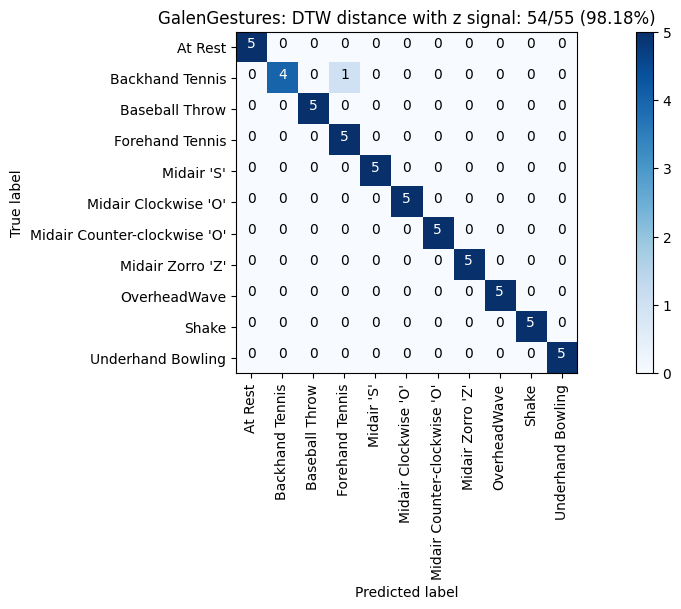

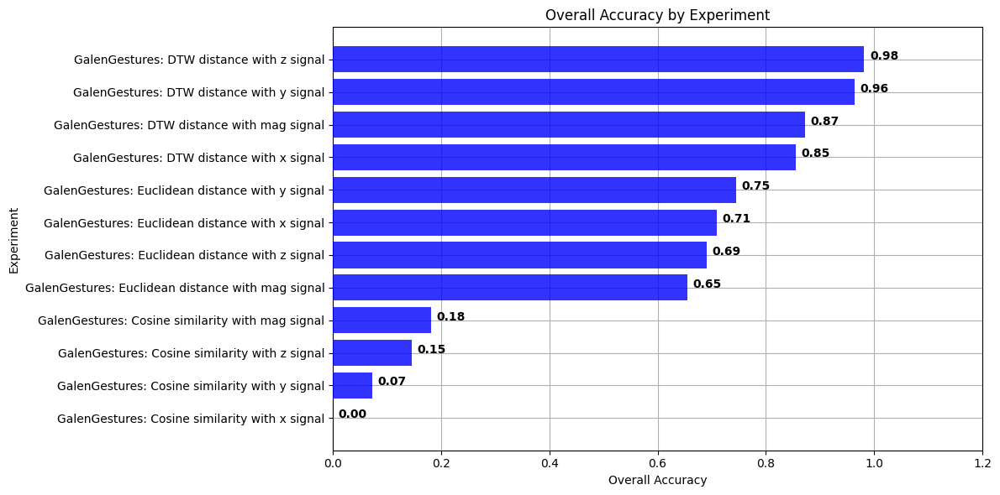

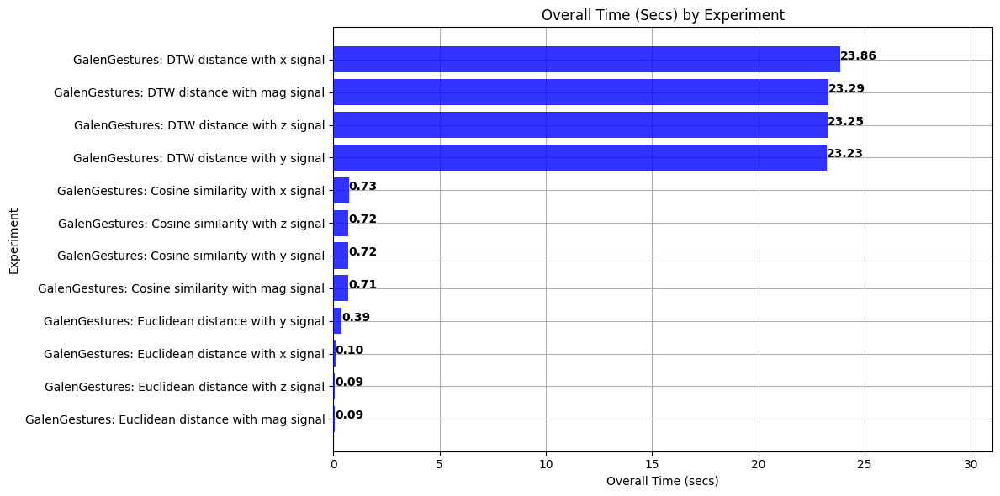

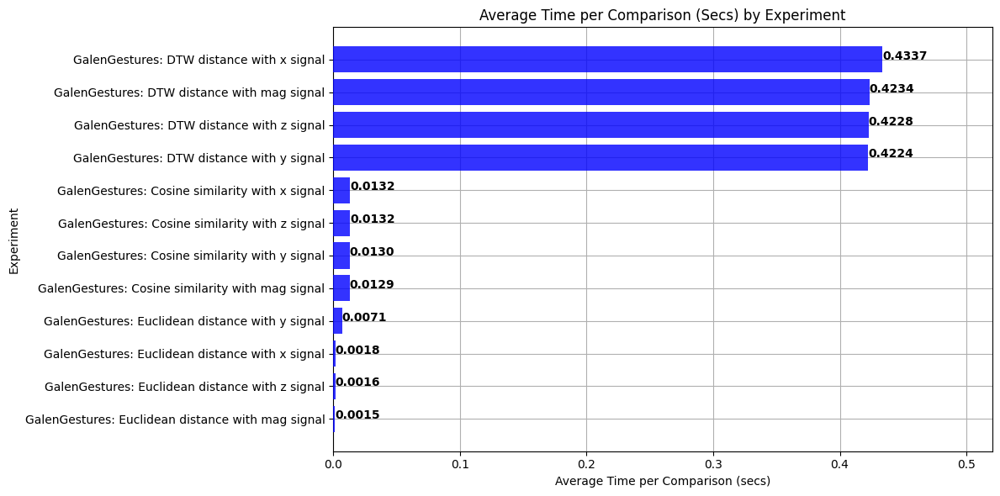

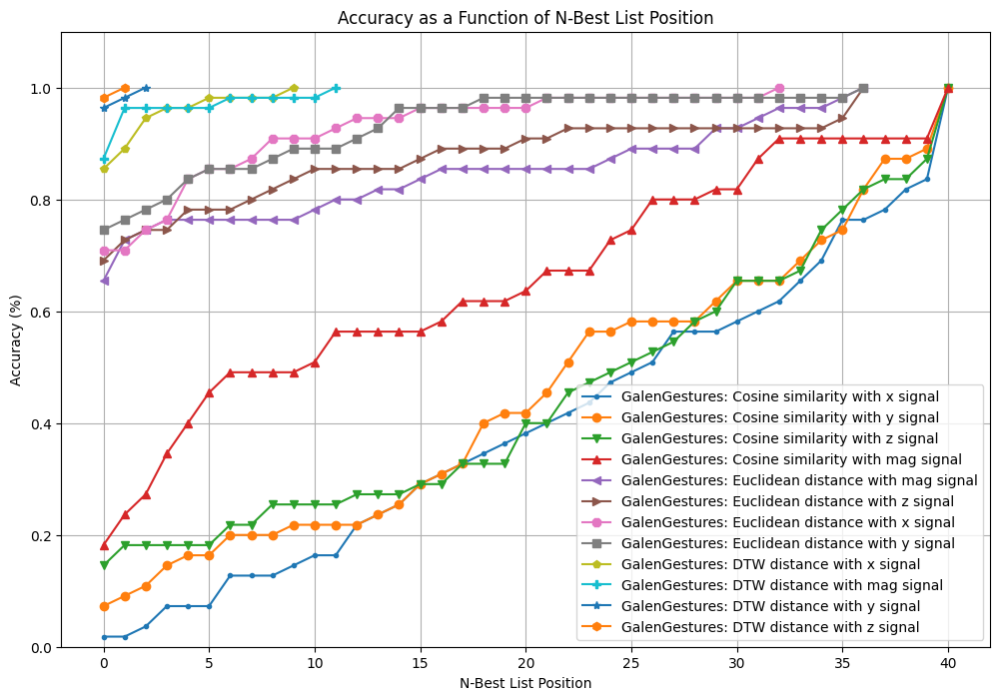

In [23]:
plot_classification_result_as_confusion_matrix(results_dtw_z)
plot_bar_graph_overall_performance(experiments)
plot_bar_graph_overall_time(experiments)
plot_bar_graph_avg_time_per_comparison(experiments)
plot_nbestlist_performance(experiments)

# Comparing performance across gesture sets

56 gesture set names in total.
Now processing set 1 of 56  |  kyheGestures
Now processing set 2 of 56  |  Matt
Now processing set 3 of 56  |  JonGestures
Now processing set 4 of 56  |  Steph
Now processing set 5 of 56  |  emanuelshalevGestures
Now processing set 6 of 56  |  martypletcher400hzGestures
Now processing set 7 of 56  |  Nathalie
Now processing set 8 of 56  |  AGestures
Now processing set 9 of 56  |  StacyGestures
Now processing set 10 of 56  |  wessonGestures
Now processing set 11 of 56  |  AnjaliGestures
Now processing set 12 of 56  |  ShaunGestures
Now processing set 13 of 56  |  JuliaBGestures
Now processing set 14 of 56  |  SamuelRGestures
Now processing set 15 of 56  |  MikaelGestures
Now processing set 16 of 56  |  Chris
Now processing set 17 of 56  |  Anne
Now processing set 18 of 56  |  ThweidGestures
Now processing set 19 of 56  |  MattCGestures
Now processing set 20 of 56  |  Jose
Now processing set 21 of 56  |  DustinGestures


/tmp/ipykernel_5103/3944369123.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 6))


Now processing set 22 of 56  |  GalenFastGestures
Now processing set 23 of 56  |  AlexisGestures
Now processing set 24 of 56  |  EmmaGestures
Now processing set 25 of 56  |  RahulGestures
Now processing set 26 of 56  |  GalenGestures
Now processing set 27 of 56  |  ClayGestures
Now processing set 28 of 56  |  EvanGearyGestures
Now processing set 29 of 56  |  BryanGestures
Now processing set 30 of 56  |  NanGestures
Now processing set 31 of 56  |  JustinGestures
Now processing set 32 of 56  |  WolfGestures
Now processing set 33 of 56  |  sruthiGestures
Now processing set 34 of 56  |  JonGesturesHarder
Now processing set 35 of 56  |  JaeHGestures
Now processing set 36 of 56  |  NeilGestures
Now processing set 37 of 56  |  AlexandraGestures
Now processing set 38 of 56  |  jlinGestures
Now processing set 39 of 56  |  NickGestures
Now processing set 40 of 56  |  loumagGestures
Now processing set 41 of 56  |  GalenMediumGestures
Now processing set 42 of 56  |  JasonGestures
Now processing se

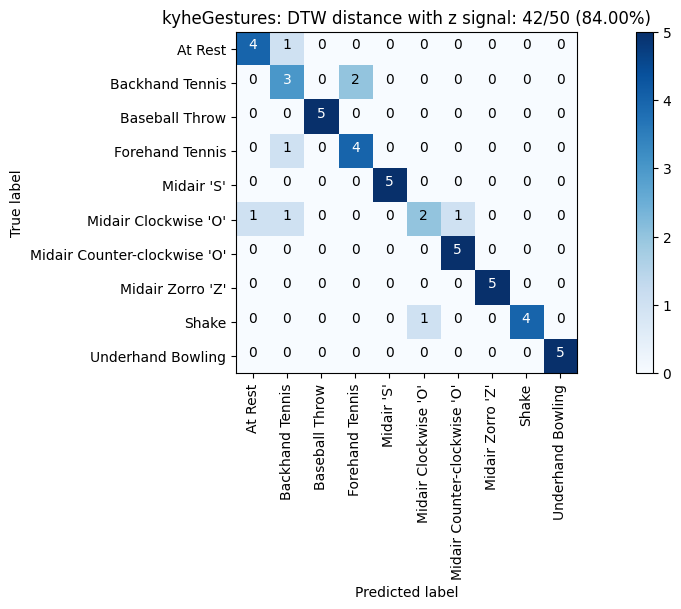

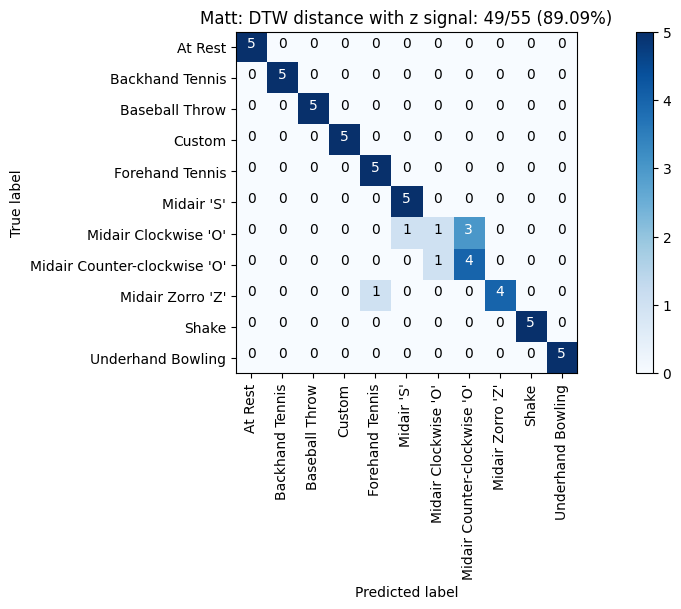

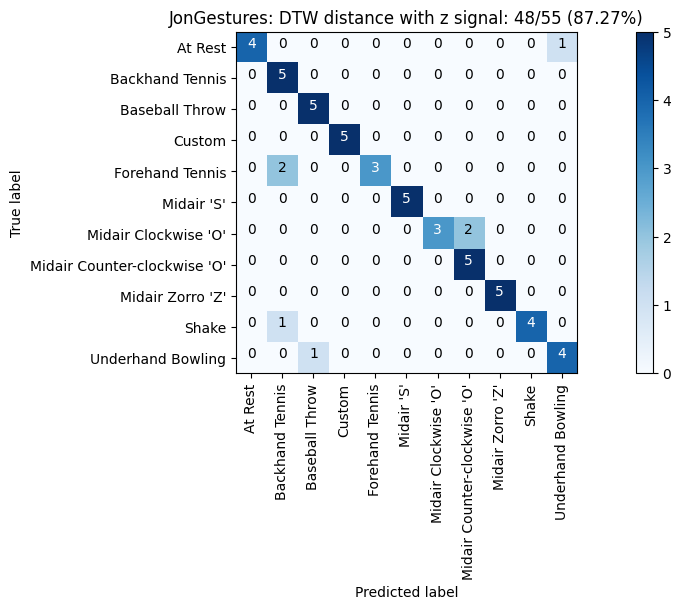

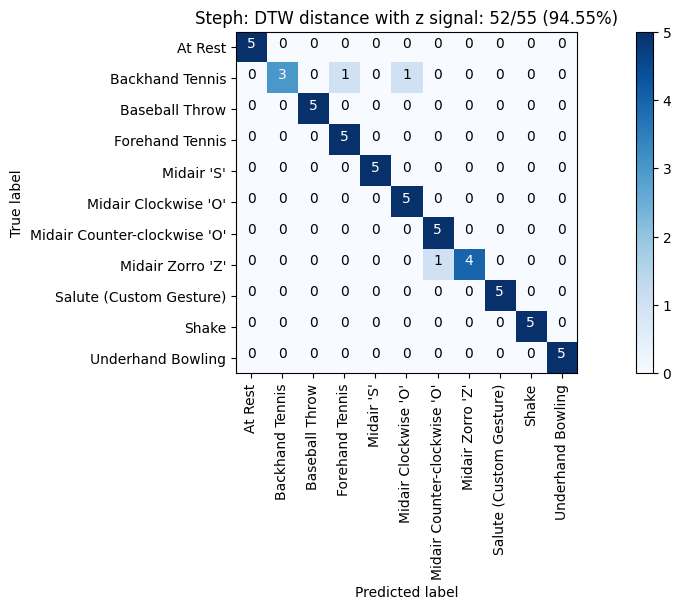

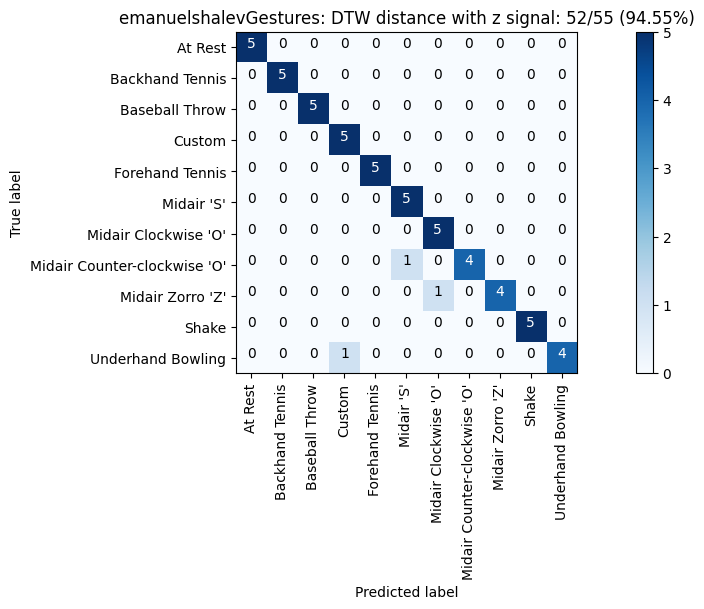

...

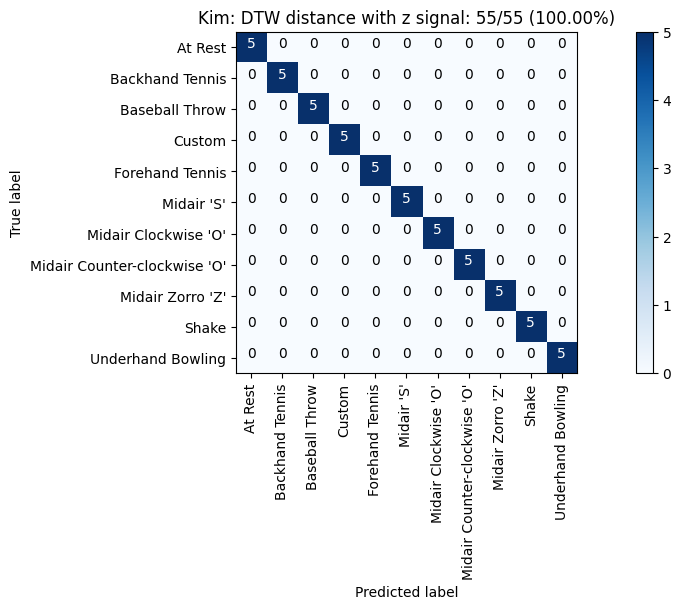

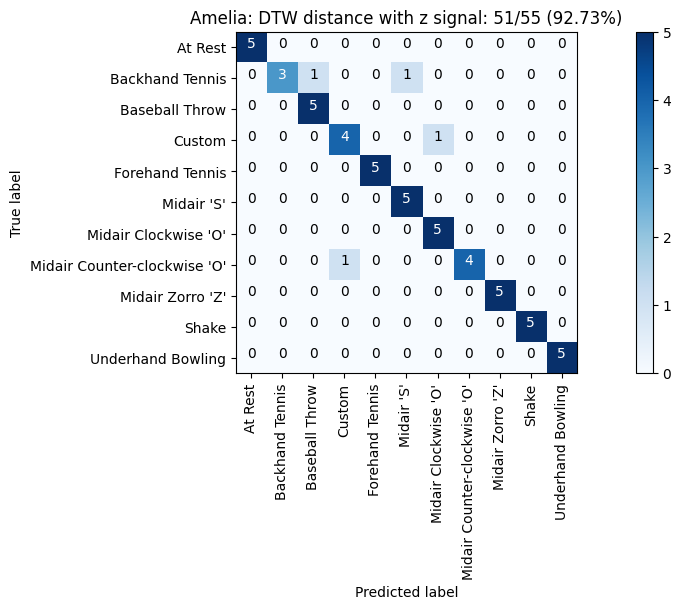

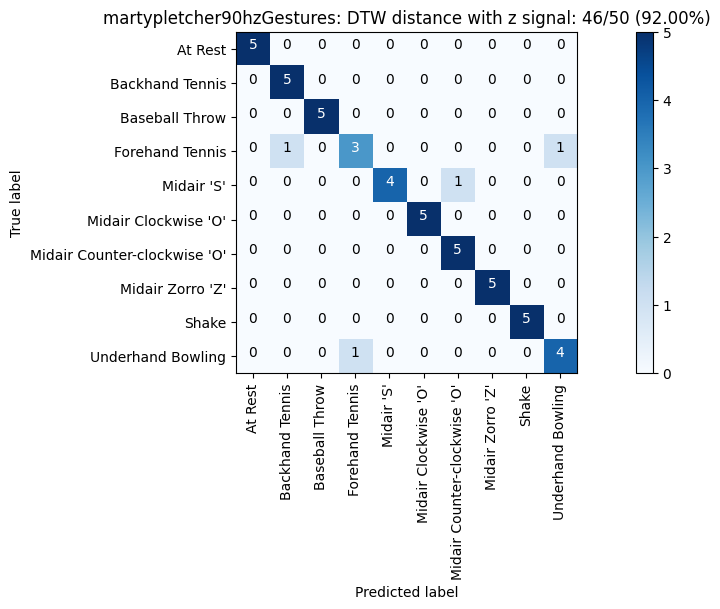

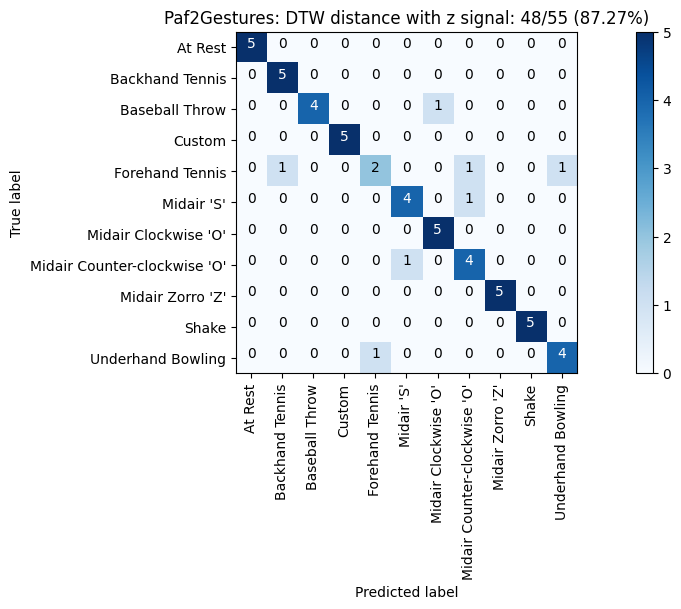

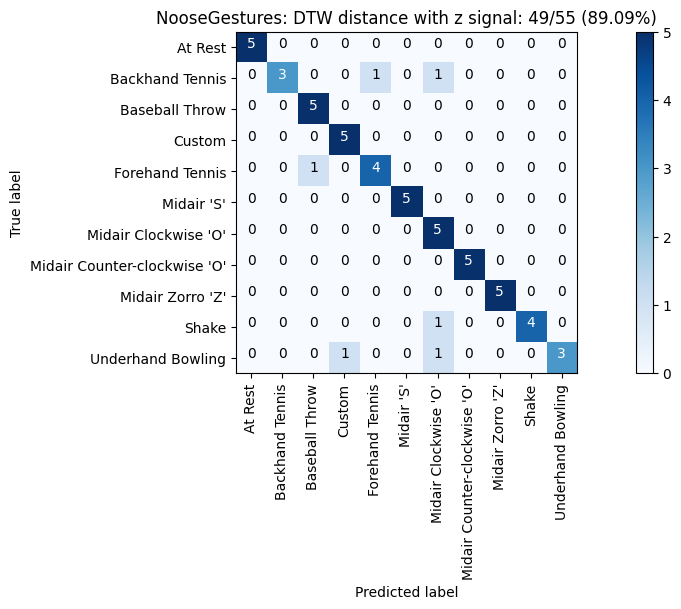

In [24]:
# track multiple experiments
experiments = Experiments()

num_sets = len(list(map_gesture_sets.items()))
print(f"{num_sets} gesture set names in total.")
i=1
# Run experiments across all gesture sets
for gesture_set_name, gesture_set in map_gesture_sets.items():
    print(f"Now processing set {i} of {num_sets}  |  {gesture_set_name}")
    i+=1


    # These large gesture sets are breaking gesturerec and causing a kernel overflow or something
    # I know it's not my machine because it's an AI workstation
    if gesture_set_name in ['GalenSlowGestures', 'GalenMediumGestures', 'GalenFastGestures']:
        continue
    
    list_folds = generate_kfolds_scikit(5, gesture_set, seed=5)
    # run initial experiment
    # results_x = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='x')
    # results_x.title = "{}: Euclidean distance with x signal".format(gesture_set.name)
    # experiments.add(results_x)
    
    # # run second experiment 
    # # just giving you a sense of how you can run and track multiple experiments
    # results_y = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='y')
    # results_y.title = "{}: Euclidean distance with y signal".format(gesture_set.name)
    # experiments.add(results_y)
    
    # # run third experiment 
    # results_z = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='z')
    # results_z.title = "{}: Euclidean distance with z signal".format(gesture_set.name)
    # experiments.add(results_z)
    
    # results_mag = run_matching_algorithm(list_folds, find_closest_match_euclid_signal, verbose=False, signal_var_name='mag')
    # results_mag.title = "{}: Euclidean distance with mag signal".format(gesture_set.name)
    # experiments.add(results_mag)
    
    # DTW euclidean
    # results_dtw_x = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='x')
    # results_dtw_x.title = "{}: DTW distance with x signal".format(gesture_set.name)
    # experiments.add(results_dtw_x)
    
    # results_dtw_y = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='y')
    # results_dtw_y.title = "{}: DTW distance with y signal".format(gesture_set.name)
    # experiments.add(results_dtw_y)
    
    results_dtw_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z')
    results_dtw_z.title = "{}: DTW distance with z signal".format(gesture_set.name)
    experiments.add(results_dtw_z)
    plot_classification_result_as_confusion_matrix(results_dtw_z)
    
    # results_dtw_mag = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='mag')
    # results_dtw_mag.title = "{}: DTW distance with mag signal".format(gesture_set.name)
    # experiments.add(results_dtw_mag)

    # # Cosine Similarity
    # results_cos_x = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='x')
    # results_cos_x.title = "{}: Cosine similarity with x signal".format(gesture_set.name)
    # experiments.add(results_cos_x)
    
    # results_cos_y = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='y')
    # results_cos_y.title = "{}: Cosine similarity with y signal".format(gesture_set.name)
    # experiments.add(results_cos_y)
    
    # results_cos_z = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='z')
    # results_cos_z.title = "{}: Cosine similarity with z signal".format(gesture_set.name)
    # experiments.add(results_cos_z)
    
    # results_cos_mag = run_matching_algorithm(list_folds, find_closest_match_cos, verbose=False, signal_var_name='mag')
    # results_cos_mag.title = "{}: Cosine similarity with mag signal".format(gesture_set.name)
    # experiments.add(results_cos_mag)

avg_accuracy, stddev = experiments.get_avg_accuracy_with_std()
print(f"Average accuracy: {avg_accuracy} Stdev={stddev}")

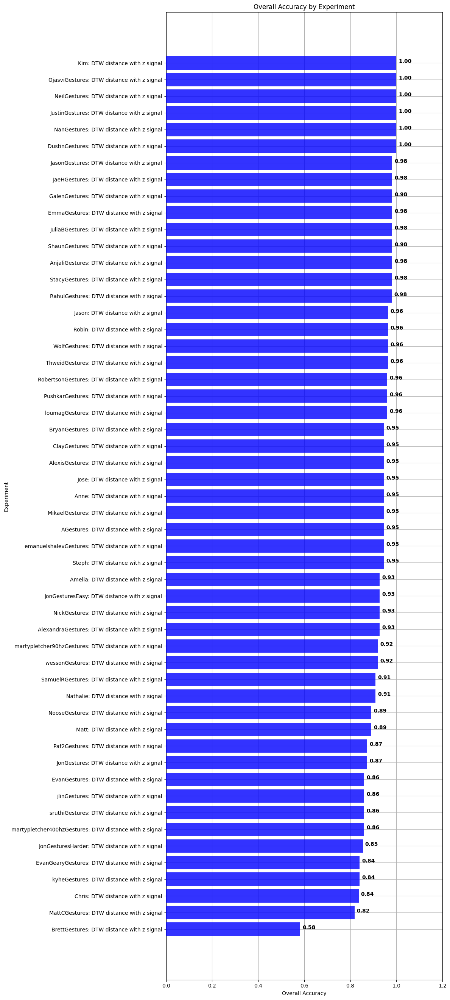

In [25]:
plot_bar_graph_overall_performance(experiments)

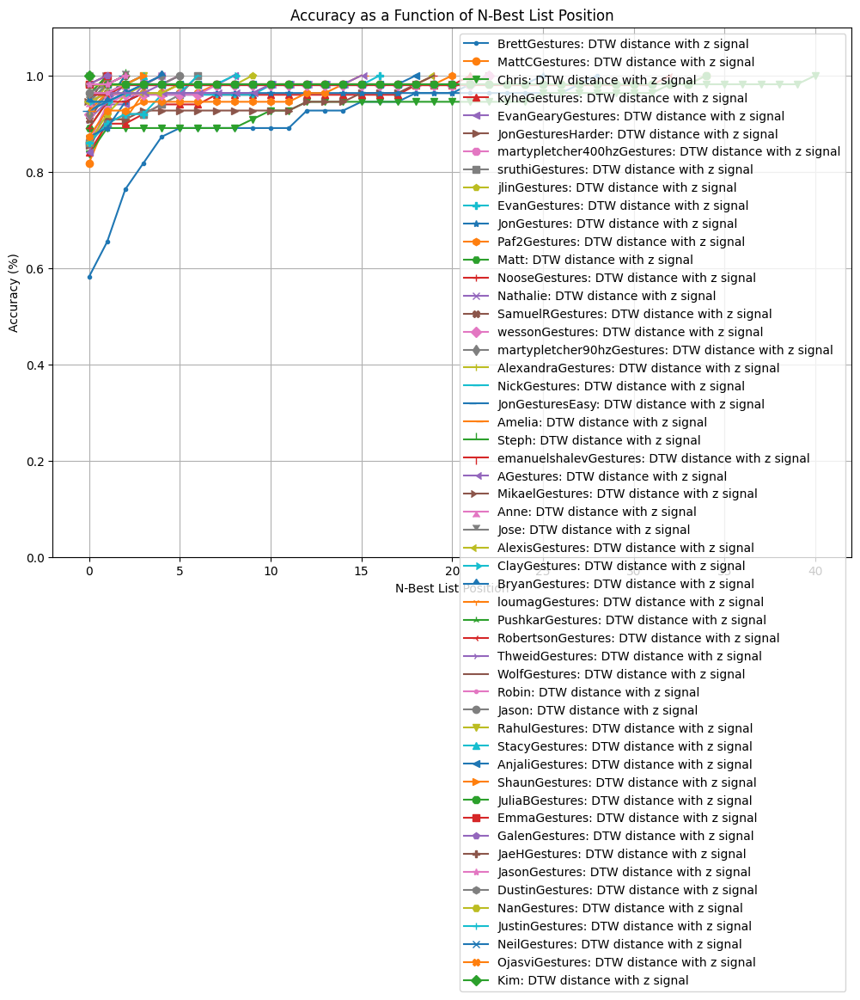

In [26]:
plot_nbestlist_performance(experiments)

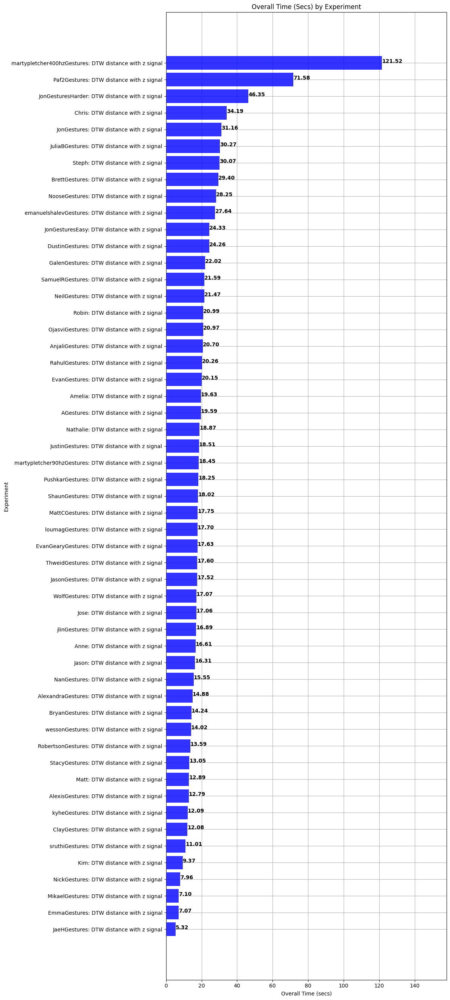

In [27]:
plot_bar_graph_overall_time(experiments)

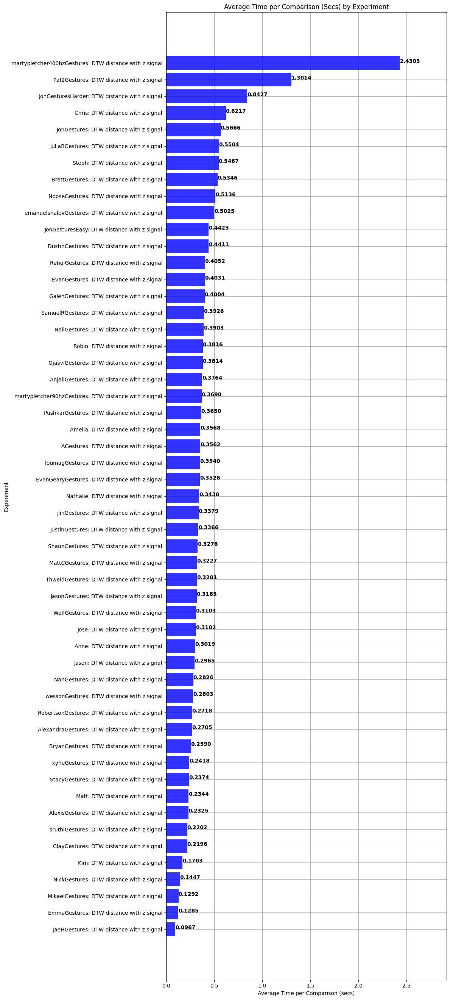

In [28]:
plot_bar_graph_avg_time_per_comparison(experiments)

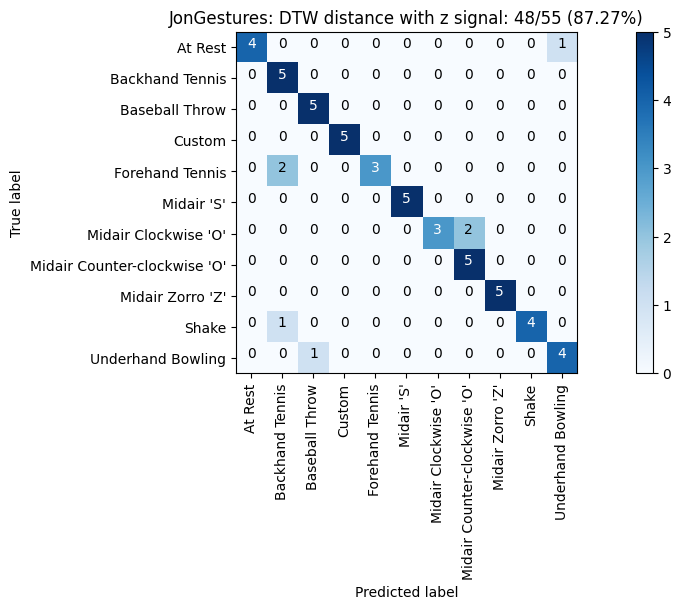

In [29]:
#conf matrix for JonGestures
gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "JonGestures")
list_folds = generate_kfolds_scikit(5, gesture_set, seed=5)
results_dtw_z = run_matching_algorithm(list_folds, find_closest_match_dtw, verbose=False, signal_var_name='z')
results_dtw_z.title = "{}: DTW distance with z signal".format(gesture_set.name)
plot_classification_result_as_confusion_matrix(results_dtw_z)